# **Goal of this template is to use different models and tune them using GridSearchCV and/or RandomSearcg**

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

import chardet

from utilities.loaders import (
    load_corpus,
    get_chars,
    load_lookup_array,
    save_lookup_array,
    load_meta_data,
    save_meta_data,
    load_tokenizer,
    save_tokenizer,
    construct_embedding_dict,
    construct_embedding_matrix,
    get_cat_cols,
    get_top_models,
    load_model,
    save_model,
    create_image_set,
    create_metrics_df,
    create_classified_df)

from utilities.preprocessors import (
    map_value_to_index,
    remove_contractions,
    rem_non_alpha_num,
    rem_numeric,
    capitalize,
    filter_valid,
    partition_corpus,
    rem_stop_words,
    stem_corpus_words,
    lemmatize_corpus_words,
    strip_final_corpus,
    string_list_to_list,
    sentences2tok_sequences,
    pad_token_sequences,
    join_word_list,
    clean_tweets,
    lower_words,
    flatten_series_of_lists,
    sentences_to_avgs,
    init_sequences,
    decode_id_sequences,
    decode_one_hot,
    re_encode_sparse_labels,
    translate_labels,
    normalize_ratings,
    normalize_rating_matrix,
    normalize_train_cross,
    encode_features,
    encode_image,
    standardize_image)
    

from utilities.visualizers import (
    plot_train_cross_features,
    analyze,
    view_words,
    data_split_metric_values,
    view_value_frequency,
    multi_class_heatmap,
    view_metric_values,
    view_classified_labels,
    view_label_freq,
    disp_cat_feat,
    describe_col,
    visualize_graph,
    plot_evolution,
    view_clusters_3d,
    ModelResults,
    plot_all_features,
    view_images,
    view_all_splits_results)
    

%load_ext autoreload
%autoreload 2

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Mig\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Mig\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


# Loading data

In [4]:
ddr = pd.read_csv('./data/depression_dataset_reddit_cleaned.csv', )
ddr

,clean_text,is_depression
0,we understand that most people who reply immed...,1
1,welcome to r depression s check in post a plac...,1
2,anyone else instead of sleeping more when depr...,1
3,i ve kind of stuffed around a lot in my life d...,1
4,sleep is my greatest and most comforting escap...,1
...,...,...
7726,is that snow,0
7727,moulin rouge mad me cry once again,0
7728,trying to shout but can t find people on the list,0
7729,ughh can t find my red sox hat got ta wear thi...,0


In [15]:
ddr.rename(columns={'is_depression': 'label'}, inplace=True)
ddr

,clean_text,label
0,understand peopl repli immedi op invit talk pr...,1
1,welcom r depress check post place take moment ...,1
2,anyon el instead sleep depress stay night avoi...,1
3,kind stuf around lot life delay inevit work jo...,1
4,sleep greatest comfort escap whenev wake day l...,1
...,...,...
7726,snow,0
7727,moulin roug mad cri,0
7728,tri shout find peopl list,0
7729,ughh find red sox hat got ta wear creepi nick ...,0


In [16]:
ddr['clean_text'] = ddr['clean_text'].apply(lower_words)
ddr

understand peopl repli immedi op invit talk privat mean help type respons usual lead either disappoint disast usual work quit differ say pm anytim casual social context huge admir appreci goodwil good citizenship mani support other flag inappropri content even know mani struggl hard work behind scene inform resourc make easier give get qualiti help small start new wiki page explain detail much better respond public comment least gotten know someon maintain r depress wiki privat contact full text current version summari anyon act helper invit accept privat contact e pm chat kind offsit communic earli convers show either bad intent bad judgement either way unwis trust pm anytim seem like kind generous offer might perfect well mean unless solid rapport ha establish wise idea point consid offer accept invit communic privat post support repli public help peopl op respons good qualiti educ inspir helper rule http en wikipedia org wiki rule internet cultur appli much doe anywher el internet p

,clean_text,label
0,understand peopl repli immedi op invit talk pr...,1
1,welcom r depress check post place take moment ...,1
2,anyon el instead sleep depress stay night avoi...,1
3,kind stuf around lot life delay inevit work jo...,1
4,sleep greatest comfort escap whenev wake day l...,1
...,...,...
7726,snow,0
7727,moulin roug mad cri,0
7728,tri shout find peopl list,0
7729,ughh find red sox hat got ta wear creepi nick ...,0


In [17]:
ddr['clean_text'] = ddr['clean_text'].apply(remove_contractions)
ddr

understand peopl repli immedi op invit talk privat mean help type respons usual lead either disappoint disast usual work quit differ say pm anytim casual social context huge admir appreci goodwil good citizenship mani support other flag inappropri content even know mani struggl hard work behind scene inform resourc make easier give get qualiti help small start new wiki page explain detail much better respond public comment least gotten know someon maintain r depress wiki privat contact full text current version summari anyon act helper invit accept privat contact e pm chat kind offsit communic earli convers show either bad intent bad judgement either way unwis trust pm anytim seem like kind generous offer might perfect well mean unless solid rapport ha establish wise idea point consid offer accept invit communic privat post support repli public help peopl op respons good qualiti educ inspir helper rule http en wikipedia org wiki rule internet cultur appli much doe anywher el internet p

,clean_text,label
0,understand peopl repli immedi op invit talk pr...,1
1,welcom r depress check post place take moment ...,1
2,anyon el instead sleep depress stay night avoi...,1
3,kind stuf around lot life delay inevit work jo...,1
4,sleep greatest comfort escap whenev wake day l...,1
...,...,...
7726,snow,0
7727,moulin roug mad cri,0
7728,tri shout find peopl list,0
7729,ughh find red sox hat got ta wear creepi nick ...,0


In [18]:
ddr['clean_text'] = ddr['clean_text'].apply(rem_non_alpha_num)
ddr

understand peopl repli immedi op invit talk privat mean help type respons usual lead either disappoint disast usual work quit differ say pm anytim casual social context huge admir appreci goodwil good citizenship mani support other flag inappropri content even know mani struggl hard work behind scene inform resourc make easier give get qualiti help small start new wiki page explain detail much better respond public comment least gotten know someon maintain r depress wiki privat contact full text current version summari anyon act helper invit accept privat contact e pm chat kind offsit communic earli convers show either bad intent bad judgement either way unwis trust pm anytim seem like kind generous offer might perfect well mean unless solid rapport ha establish wise idea point consid offer accept invit communic privat post support repli public help peopl op respons good qualiti educ inspir helper rule http en wikipedia org wiki rule internet cultur appli much doe anywher el internet p

,clean_text,label
0,understand peopl repli immedi op invit talk pr...,1
1,welcom r depress check post place take moment ...,1
2,anyon el instead sleep depress stay night avoi...,1
3,kind stuf around lot life delay inevit work jo...,1
4,sleep greatest comfort escap whenev wake day l...,1
...,...,...
7726,snow,0
7727,moulin roug mad cri,0
7728,tri shout find peopl list,0
7729,ughh find red sox hat got ta wear creepi nick ...,0


In [19]:
ddr['clean_text'] = ddr['clean_text'].apply(rem_numeric)
ddr

understand peopl repli immedi op invit talk privat mean help type respons usual lead either disappoint disast usual work quit differ say pm anytim casual social context huge admir appreci goodwil good citizenship mani support other flag inappropri content even know mani struggl hard work behind scene inform resourc make easier give get qualiti help small start new wiki page explain detail much better respond public comment least gotten know someon maintain r depress wiki privat contact full text current version summari anyon act helper invit accept privat contact e pm chat kind offsit communic earli convers show either bad intent bad judgement either way unwis trust pm anytim seem like kind generous offer might perfect well mean unless solid rapport ha establish wise idea point consid offer accept invit communic privat post support repli public help peopl op respons good qualiti educ inspir helper rule http en wikipedia org wiki rule internet cultur appli much doe anywher el internet p

,clean_text,label
0,understand peopl repli immedi op invit talk pr...,1
1,welcom r depress check post place take moment ...,1
2,anyon el instead sleep depress stay night avoi...,1
3,kind stuf around lot life delay inevit work jo...,1
4,sleep greatest comfort escap whenev wake day l...,1
...,...,...
7726,snow,0
7727,moulin roug mad cri,0
7728,tri shout find peopl list,0
7729,ughh find red sox hat got ta wear creepi nick ...,0


In [20]:
ddr['clean_text'] = ddr['clean_text'].apply(rem_stop_words)
ddr

understand peopl repli immedi op invit talk privat mean help type respons usual lead either disappoint disast usual work quit differ say pm anytim casual social context huge admir appreci goodwil good citizenship mani support flag inappropri content even know mani struggl hard work behind scene inform resourc make easier give get qualiti help small start new wiki page explain detail much better respond public comment least gotten know someon maintain r depress wiki privat contact full text current version summari anyon act helper invit accept privat contact e pm chat kind offsit communic earli convers show either bad intent bad judgement either way unwis trust pm anytim seem like kind generous offer might perfect well mean unless solid rapport ha establish wise idea point consid offer accept invit communic privat post support repli public help peopl op respons good qualiti educ inspir helper rule http en wikipedia org wiki rule internet cultur appli much doe anywher el internet peopl s

,clean_text,label
0,understand peopl repli immedi op invit talk pr...,1
1,welcom r depress check post place take moment ...,1
2,anyon el instead sleep depress stay night avoi...,1
3,kind stuf around lot life delay inevit work jo...,1
4,sleep greatest comfort escap whenev wake day l...,1
...,...,...
7726,snow,0
7727,moulin roug mad cri,0
7728,tri shout find peopl list,0
7729,ughh find red sox hat got ta wear creepi nick ...,0


In [21]:
ddr['clean_text'] = ddr['clean_text'].apply(stem_corpus_words)
ddr

understand peopl repli immedi op invit talk privat mean help type respon usual lead either disappoint disast usual work quit differ say pm anytim casual social context huge admir appreci goodwil good citizenship mani support flag inappropri content even know mani struggl hard work behind scene inform resourc make easier give get qualiti help small start new wiki page explain detail much better respond public comment least gotten know someon maintain r depress wiki privat contact full text current version summari anyon act helper invit accept privat contact e pm chat kind offsit communic ear conver show either bad intent bad judgement either way unwi trust pm anytim seem like kind generous offer might perfect well mean unless solid rapport ha establish wise idea point consid offer accept invit communic privat post support repli public help peopl op respon good qualiti educ inspir helper rule http en wikipedia org wiki rule internet cultur appli much doe anywh el internet peopl struggl s

,clean_text,label
0,understand peopl repli immedi op invit talk pr...,1
1,welcom r depress check post place take moment ...,1
2,anyon el instead sleep depress stay night avoi...,1
3,kind stuf around lot life delay inevit work jo...,1
4,sleep greatest comfort escap whenev wake day l...,1
...,...,...
7726,snow,0
7727,moulin roug mad cri,0
7728,tri shout find peopl list,0
7729,ughh find red sox hat got ta wear creepi nick ...,0


In [22]:
ddr['clean_text'] = ddr['clean_text'].apply(lemmatize_corpus_words)
ddr

understand peopl repli immedi op invit talk privat mean help type respon usual lead either disappoint disast usual work quit differ say pm anytim casual social context huge admir appreci goodwil good citizenship mani support flag inappropri content even know mani struggl hard work behind scene inform resourc make easier give get qualiti help small start new wiki page explain detail much better respond public comment least gotten know someon maintain r depress wiki privat contact full text current version summari anyon act helper invit accept privat contact e pm chat kind offsit communic ear conver show either bad intent bad judgement either way unwi trust pm anytim seem like kind generous offer might perfect well mean unless solid rapport ha establish wise idea point consid offer accept invit communic privat post support repli public help peopl op respon good qualiti educ inspir helper rule http en wikipedia org wiki rule internet cultur appli much doe anywh el internet peopl struggl s

,clean_text,label
0,understand peopl repli immedi op invit talk pr...,1
1,welcom r depress check post place take moment ...,1
2,anyon el instead sleep depress stay night avoi...,1
3,kind stuf around lot life delay inevit work jo...,1
4,sleep greatest comfort escap whenev wake day l...,1
...,...,...
7726,snow,0
7727,moulin roug mad cri,0
7728,tri shout find peopl list,0
7729,ughh find red sox hat got ta wear creepi nick ...,0


In [23]:
ddr['clean_text'] = ddr['clean_text'].apply(strip_final_corpus)
ddr

,clean_text,label
0,understand peopl repli immedi op invit talk pr...,1
1,welcom r depress check post place take moment ...,1
2,anyon el instead sleep depress stay night avoi...,1
3,kind stuf around lot life delay inevit work jo...,1
4,sleep greatest comfort escap whenev wake day l...,1
...,...,...
7726,snow,0
7727,moulin roug mad cri,0
7728,tri shout find peopl list,0
7729,ughh find red sox hat got ta wear creepi nick ...,0


d:\Projects\To Github\project-seraphim\server-side\modelling\utilities\visualizers.py:359: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  axis = sb.barplot(x=label_freq.values, y=labels, palette="flare") \


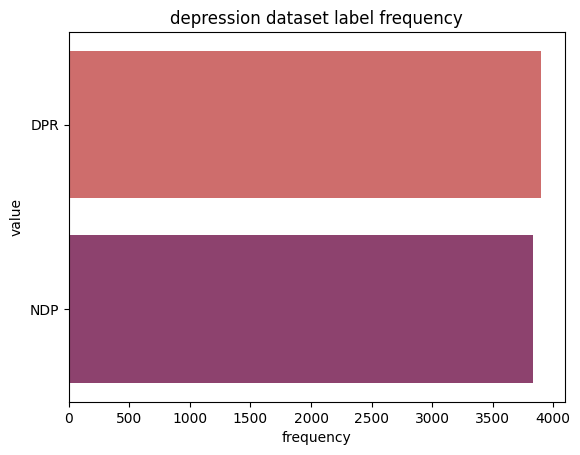

In [24]:
view_label_freq(ddr['label'].value_counts(), img_title='depression dataset label frequency', save_img=True, labels=['DPR', 'NDP'])

In [26]:
ddr['label'] = re_encode_sparse_labels(ddr['label'], new_labels=['NDP', 'DPR'])
ddr

,clean_text,label
0,understand peopl repli immedi op invit talk pr...,DPR
1,welcom r depress check post place take moment ...,DPR
2,anyon el instead sleep depress stay night avoi...,DPR
3,kind stuf around lot life delay inevit work jo...,DPR
4,sleep greatest comfort escap whenev wake day l...,DPR
...,...,...
7726,snow,NDP
7727,moulin roug mad cri,NDP
7728,tri shout find peopl list,NDP
7729,ughh find red sox hat got ta wear creepi nick ...,NDP


In [27]:
ddr['label'], ddr_le = encode_features(ddr['label'])
ddr

,clean_text,label
0,understand peopl repli immedi op invit talk pr...,0
1,welcom r depress check post place take moment ...,0
2,anyon el instead sleep depress stay night avoi...,0
3,kind stuf around lot life delay inevit work jo...,0
4,sleep greatest comfort escap whenev wake day l...,0
...,...,...
7726,snow,1
7727,moulin roug mad cri,1
7728,tri shout find peopl list,1
7729,ughh find red sox hat got ta wear creepi nick ...,1


In [29]:
save_model(ddr_le, './saved/misc/ddr_le.pkl')

In [28]:
ddr_le.inverse_transform(ddr['label'])

array(['DPR', 'DPR', 'DPR', ..., 'NDP', 'NDP', 'NDP'], dtype=object)

In [31]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [32]:
X_trains, X_, Y_trains, Y_ = train_test_split(ddr['clean_text'], ddr['label'], test_size=0.3, random_state=0)
X_cross, X_tests, Y_cross, Y_tests = train_test_split(X_, Y_, test_size=0.5, random_state=0)

In [33]:
X_trains

6778                        tombot never mind work anyway
189     hey everyon long time reader sub wan na say fi...
4521                                       got text sarah
7083       andr riue neighbour ha world come internet lol
6885                      play pkr onlin poker ha headach
                              ...                        
4931    morn starv die cuppa co doc fast blood test littl
3264                                              depress
1653    tw mention anxieti ocd allerg reaction back st...
2607    noth life good school shit quit weed witch wa ...
2732    depress bad function proper shower everi day b...
Name: clean_text, Length: 5411, dtype: object

In [38]:
vectorizer = TfidfVectorizer()
vectorizer.fit(X_trains)
X_trains_vec = vectorizer.transform(X_trains).toarray()
X_cross_vec = vectorizer.transform(X_cross).toarray()
X_tests_vec = vectorizer.transform(X_tests).toarray()
X_trains_vec

(5411, 11968)

In [41]:
save_model(vectorizer, './saved/misc/ddr_tfidf_vec.pkl')

# Now we have the vectorized form of our dataset which we can use as features for our classifier

In [40]:
X_trains_vec.shape

(5411, 11968)

In [39]:
np.unique(X_trains_vec)

array([0.        , 0.00795346, 0.00861295, ..., 0.95954072, 0.96652224,
       1.        ])

In [43]:
X_cross_vec.shape

(1160, 11968)

In [44]:
X_tests_vec.shape

(1160, 11968)

# Loading typically models like ExtraTreesRegressor, GradientBoostingRegressor, RandomForestRegressor, XGBRegressor, LGBMRegressor, HistGradientBoostingRegressor, BaggingRegressor, DecisionTreeRegressor for regression and LGBMClassifier, XGBClassifier, AdaBoostClassifier, RandomForestClassifier, ExtraTreesClassifier for classification

In [45]:
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import ExtraTreesClassifier, AdaBoostClassifier, RandomForestClassifier

In [46]:
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor, HistGradientBoostingRegressor, BaggingRegressor

In [54]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# SOme important hyper parameters that we might use to utne for instance an XGBClassifier
n_estimators (Optional[int]) – Number of boosting rounds.

max_depth (Optional[int]) – Maximum tree depth for base learners.

max_leaves – Maximum number of leaves; 0 indicates no limit.

learning_rate (Optional[float]) – Boosting learning rate (xgb’s “eta”)

booster (Optional[str]) – Specify which booster to use: gbtree, gblinear or dart.

tree_method (Optional[str]) – Specify which tree method to use. Default to auto. If this parameter is set to default, XGBoost will choose the most conservative option available. It’s recommended to study this option from the parameters document tree method

reg_alpha (Optional[float]) – L1 regularization term on weights (xgb’s alpha).

reg_lambda (Optional[float]) - L2 regularization term on weights (xgb’s lambda).

In [58]:
ddr_clf = XGBClassifier(verbosity=2)

In [59]:
ddr_clf.fit(X_trains_vec, Y_trains)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [60]:
ddr_clf.score(X_cross_vec, Y_cross)

0.9525862068965517

In [61]:
hyper_params = {
    'n_estimators': [5, 10, 50, 100, 150, 200],
    'max_depth': [2, 3, 4, 5],
    'learning_rate': [0.01, 0.0075, 0.001, 0.003, 0.0001],
    'reg_alpha': [1, 0.9, 0.8, 0.7, 0.6, 0.5],
    'reg_lambda': [1, 0.9, 0.8, 0.7, 0.6, 0.5],
}

In [62]:
ddr_grid = GridSearchCV(ddr_clf, hyper_params, cv=5, verbose=1)

In [63]:
ddr_grid.fit(X_trains_vec, Y_trains)

Fitting 5 folds for each of 4320 candidates, totalling 21600 fits


: 